# Final Assignment


1.Name: Sanika Patne

2.NUID: 001099125

#Abstract

The goal was to construct a realistic model to precisely predict the price of houses in Melbourne. It is generally believed that it’s impossible to precisely predict the price of house as it depends on various factors. For this dataset price is the dependent variable and others are independent variables. First, major factors affecting the housing prices should be selected. Then, a model for housing price prediction should be established from linear regression. That should be applied to the Melbourne housing dataset to test the model. Through the data analysis and test it can be summarized that the linear regression model can effectively predict and analyze the housing price to some extent, while the algorithm can still be improved through more advanced machine learning methods.

# Dataset

This is a  static snapshot of a dataset created by Tony Pino.

It was scraped from publicly available results posted every week from Domain.com.au. He cleaned it well, and now it's up to you to make data analysis magic. The dataset includes Address, Type of Real estate, Suburb, Method of Selling, Rooms, Price, Real Estate Agent, Date of Sale and distance from C.B.D.<br>
Notes on Specific Variables
Rooms: Number of rooms<br>
Price: Price in dollars<br>
Method: S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available.<br>
Type: br - bedroom(s); h - house,cottage,villa, semi,terrace; u - unit, duplex; t - townhouse; dev site - development site; o res - other residential.<br>
SellerG: Real Estate Agent<br>
Date: Date sold<br>
Distance: Distance from CBD<br>
Regionname: General Region (West, North West, North, North east …etc)<br>
Propertycount: Number of properties that exist in the suburb.<br>
Bedroom2 : Scraped # of Bedrooms (from different source)<br>
Bathroom: Number of Bathrooms<br>
Car: Number of carspots<br>
Landsize: Land Size<br>
BuildingArea: Building Size<br>
CouncilArea: Governing council for the area

#Importing required Libraries

In [ ]:
#importing all the important libraries
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import numpy as np
import pandas as pd
import random
import os
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from scipy.stats import skew, norm
from scipy import stats
from scipy.stats import norm, skew 
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from yellowbrick.regressor import ResidualsPlot

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

pd.set_option('display.max_columns', None)

from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
import scipy
from sklearn.impute import KNNImputer


import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np

import h2o
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.automl import H2OAutoML

#%%capture
#this library can be used for validation as well as visualization of data 
#!pip install -q tensorflow_data_validation[visualization]

In [ ]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

In [ ]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     |████████████████████████████████| 177.0 MB 16 kB/s 
  Created wheel for h2o: filename=h2o-3.36.1.1-py2.py3-none-any.whl size=177068062 sha256=4fb8786ec2961fde9c08ef07abb26fe1ba108e8e35aea8a6c27362310fb09ef8
  Stored in directory: /root/.cache/pip/wheels/a6/d9/ab/5442447c7e2ccf07f66aa8b79f3877ce5382f0b95e6c0c797b
Successfully built h2o


#Reading and Studying the data

In [ ]:
data = pd.read_csv("https://github.com/Sanikap05/DataScience/raw/main/sample.csv")

In [ ]:
data.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,0,2790,1,0,839,1,18,41,12,50,2,0,0,110,85,23,29,1712,1839,2,135
1,0,4520,2,0,1118,3,18,42,12,50,3,1,0,88,224,23,29,1690,1854,2,135
2,0,4882,3,0,1174,4,112,43,12,50,3,0,2,74,212,130,29,1722,1851,2,135
3,0,1027,2,0,1291,1,112,46,12,50,4,1,0,198,313,32,29,1788,1932,2,135
4,0,6101,1,0,1193,1,112,50,12,50,2,0,2,209,143,17,29,1737,1869,2,135


In [ ]:
data.shape

(6196, 21)

# Cleaning the Data by checking for nulls

In [ ]:
nanValues = data.isna()
nanColumns = nanValues.any()

columnsWithNan = data.columns[nanColumns].tolist()
print(columnsWithNan)

[]


For this dataset there is no missing value.

# Checking distribution of Variables

For linear regression all the variables must follow a normal distribution. So to check the distribution following code should be computed.

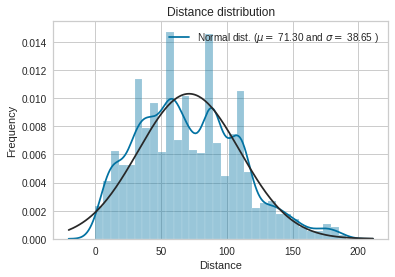

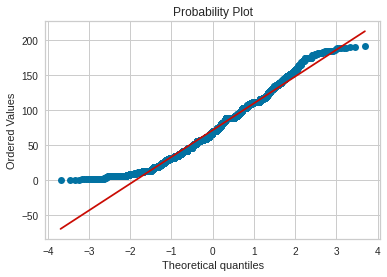

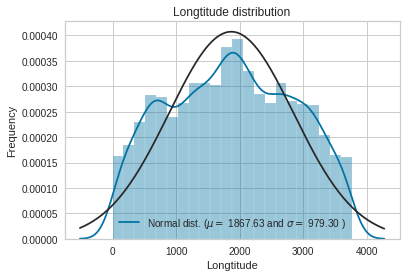

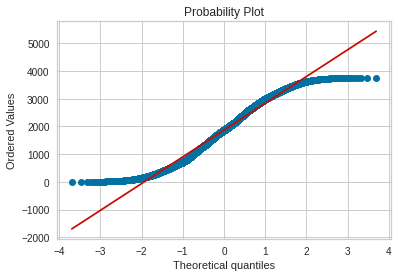

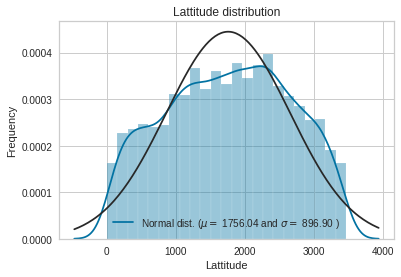

...

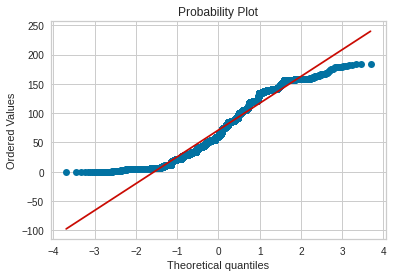

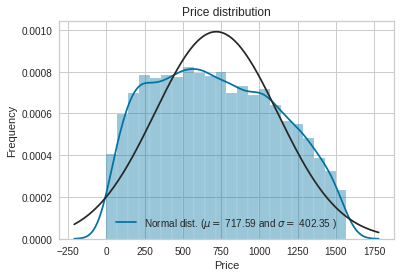

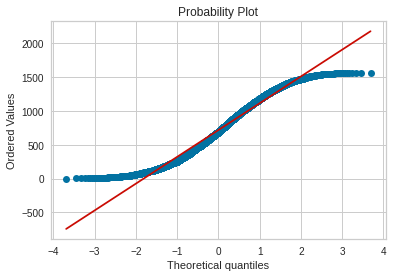

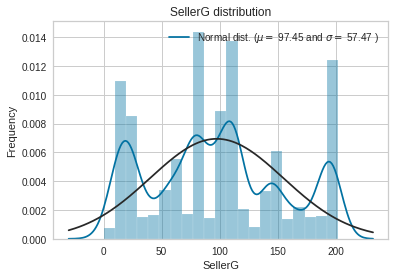

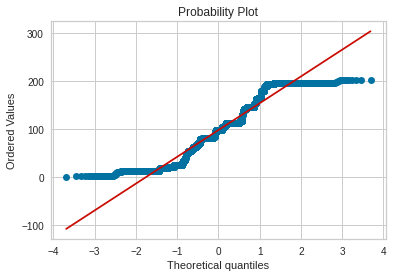

In [ ]:
sns.distplot(data['Distance'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(data['Distance'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Distance distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['Distance'], plot=plt)
plt.show()


sns.distplot(data['Longtitude'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(data['Longtitude'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Longtitude distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['Longtitude'], plot=plt)
plt.show()

sns.distplot(data['Lattitude'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(data['Lattitude'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Lattitude distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['Lattitude'], plot=plt)
plt.show()

sns.distplot(data['BuildingArea'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(data['BuildingArea'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('BuildingArea distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['BuildingArea'], plot=plt)
plt.show()


sns.distplot(data['Postcode'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(data['Postcode'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Postcode distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['Postcode'], plot=plt)
plt.show()

sns.distplot(data['Price'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(data['Price'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Price distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['Price'], plot=plt)
plt.show()


sns.distplot(data['SellerG'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(data['SellerG'])
#print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SellerG distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(data['SellerG'], plot=plt)
plt.show()



For the given dataset I plotted q-q plot and bell-curve for some of the independent variables. It is observed that all of them roughly follow normal distribution.

Other variables like 'Room','Bathrooms','Car, and'Type' are categorical variables and hence have not plotted their distribution.



# Analysing Relationship between variables for feature extraction

The correlation matrix is simply a table of correlations.Each random variable in the table is correlated with each of the other values in the table. This allows us to see which pairs have the highest correlation.It also tells us if it is directly dependent or inversely by signifying the positive and negative signs.

This is one of the methhod that will tell us which independent variables are useful to predict a target variable. Other than correlation matrix other methods which help us to determine independent variable importance are pairplot against the target variable and calculating p-value.



In [ ]:
data.corr()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
Suburb,1.000000,0.024420,-0.067093,0.025932,-0.141575,0.044450,0.037319,-0.002476,-0.057141,-0.118094,-0.063625,-0.071368,-0.041784,-0.048275,-0.077422,0.021999,0.042183,0.119548,-0.162079,0.002561,0.043333
Address,0.024420,1.000000,0.041700,-0.082517,0.098516,0.019083,-0.014282,0.009336,-0.067469,-0.003208,0.041206,0.037729,0.000452,0.029733,0.049860,-0.100179,0.003930,-0.026357,-0.013889,0.027305,0.019630
Rooms,-0.067093,0.041700,1.000000,-0.584355,0.592389,-0.054857,-0.018201,-0.034397,0.313438,0.022432,0.951793,0.613853,0.422526,0.458500,0.769215,-0.070348,-0.161131,0.027173,0.118598,0.008734,-0.091496
Type,0.025932,-0.082517,-0.584355,1.000000,-0.562952,0.089453,0.028784,0.009702,-0.243443,0.080003,-0.572275,-0.279236,-0.279881,-0.413588,-0.536966,0.349474,0.095130,-0.133498,-0.003457,0.050107,0.105963
Price,-0.141575,0.098516,0.592389,-0.562952,1.000000,-0.080628,-0.060926,-0.022471,-0.138974,0.219239,0.570993,0.485593,0.259399,0.321220,0.657430,-0.373501,-0.117046,-0.258689,0.265764,0.054918,0.001670
Method,0.044450,0.019083,-0.054857,0.089453,-0.080628,1.000000,-0.011475,-0.009328,-0.070698,-0.056100,-0.051046,-0.009392,-0.020787,-0.047370,-0.058531,0.038283,0.028821,0.010808,-0.072608,0.026923,-0.026624
SellerG,0.037319,-0.014282,-0.018201,0.028784,-0.060926,-0.011475,1.000000,0.008872,-0.002401,-0.019909,-0.020378,-0.028212,0.011218,-0.029546,-0.040212,0.008807,0.001324,-0.033114,-0.028572,0.016172,0.048350
Date,-0.002476,0.009336,-0.034397,0.009702,-0.022471,-0.009328,0.008872,1.000000,-0.021686,-0.003787,-0.039718,-0.045282,-0.036845,-0.011899,-0.037949,-0.003962,0.012671,-0.013014,-0.016746,0.004682,0.007892
Distance,-0.057141,-0.067469,0.313438,-0.243443,-0.138974,-0.070698,-0.002401,-0.021686,1.000000,0.219593,0.319026,0.136958,0.301202,0.362223,0.248241,0.265921,-0.275744,-0.015889,0.279464,-0.065304,-0.150722
Postcode,-0.118094,-0.003208,0.022432,0.080003,0.219239,-0.056100,-0.019909,-0.003787,0.219593,1.000000,0.023814,0.108407,0.020077,0.050818,0.071789,-0.024546,-0.081567,-0.622147,0.625907,0.015812,0.119359


Text(0.5, 1.0, 'Variable Correlation')

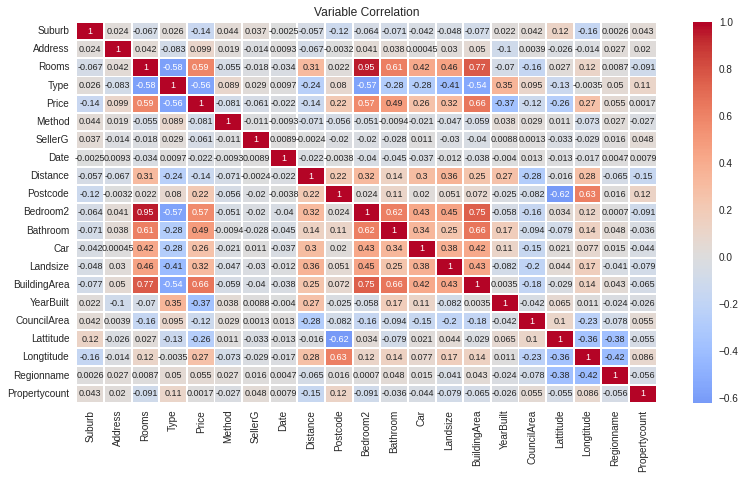

In [ ]:
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(13,7))

sns.heatmap(data.corr(),center=0, linewidths=0.9,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

Representing the same matrix in form of heatmap where shades of blue signify inverse relation and shades of red signify direct relation.

Plotting all variables against other variables to see if relation exists between them. Basically it tells the same thing as correlation matrix but in a graphical way.

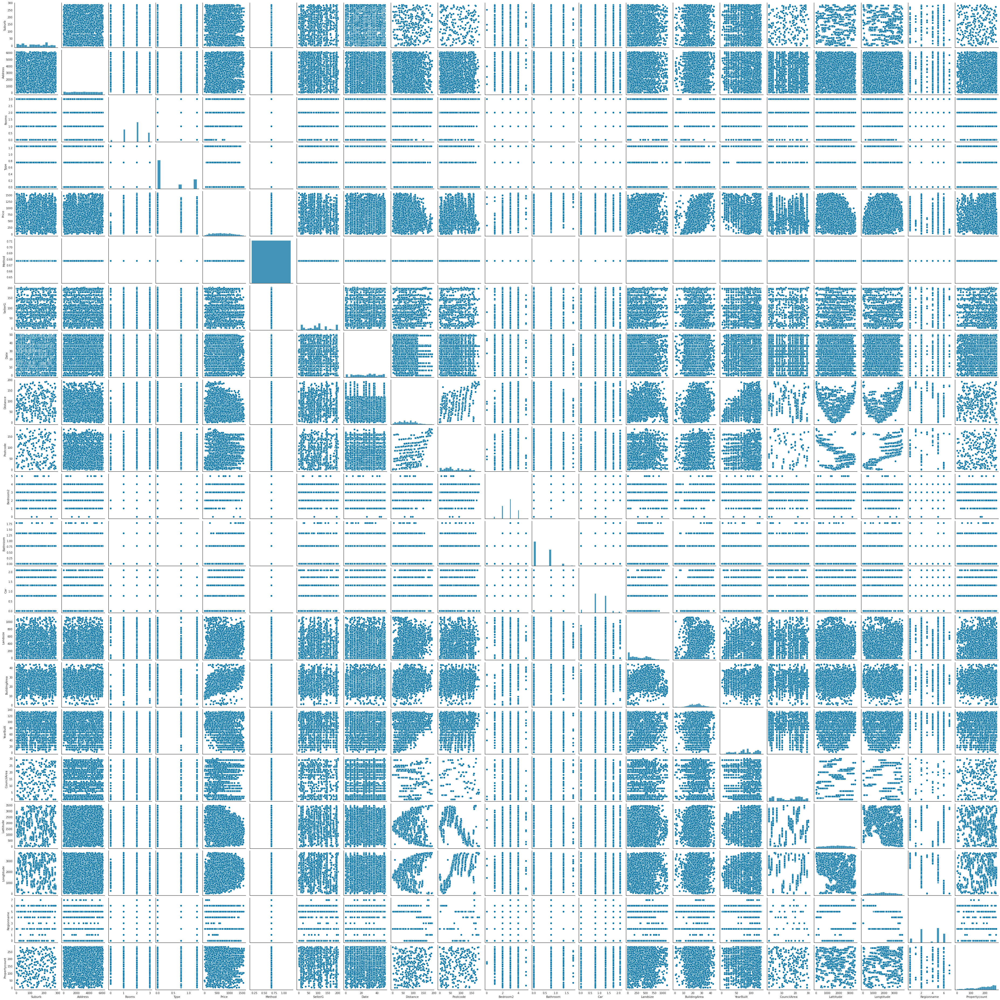

In [ ]:
sns.pairplot(data)


From the correlation matrix and the plots we can determine which variables help the most in predicting the target variable. From the matrix we can determine the same by checking which variables value is close to 1. 'BuildingArea' 'Rooms' and 'Bedroom2' have value close to 1. When all independent variables were plotted against 'price' variable it is observed that for 'Landsize' and 'BuildingArea' roughly a linear line is obtained. So it can be concluded from this plot that variables Landsize and BuildingArea have linear relation with Price.

From the plot as well as the matrix it can be observed that multicollinearity exists between independent variables.




To calculate the p-value and VIF we need to seperate the target variable from the independent ones. Then later we need to seperate the data into testing and training dataset



In [ ]:
X=data.drop(['Price'],axis=1)
y=data['Price']

In [ ]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.2,random_state=42)

In [ ]:
#Calculating VIF 
vif_data = pd.DataFrame()
vif_data["feature"] = X_train.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train.values, i)
                          for i in range(len(X_train.columns))]
  
print(vif_data)

          feature        VIF
0          Suburb   3.971947
1         Address   4.008772
2           Rooms  53.756730
3            Type   3.095120
4          Method   2.585650
5         SellerG   3.769657
6            Date   4.125136
7        Distance   7.626206
8        Postcode   8.192933
9        Bedroom2  94.086678
10       Bathroom   3.464902
11            Car   5.312394
12       Landsize   3.924441
13   BuildingArea  13.088665
14      YearBuilt  10.525404
15    CouncilArea   3.786261
16      Lattitude   7.911781
17     Longtitude  10.823703
18     Regionname   6.559713
19  Propertycount   8.062638


Variables with high collinearity have VIF value above 10. According to the output 'Rooms' , 'Bedroom2' and 'BuildingArea' have VIF greater than 10 so this tells us that there is multicollinearity among these variables.

In [ ]:
X_train.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG', 'Date',
       'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize',
       'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude',
       'Regionname', 'Propertycount'],
      dtype='object')

In [ ]:
cols= ['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG', 'Date','Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize','BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude',
       'Regionname', 'Propertycount']
model = sm.OLS(y_train,sm.add_constant(X_train[cols])).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.791
Method:                 Least Squares   F-statistic:                     936.5
Date:                Fri, 06 May 2022   Prob (F-statistic):               0.00
Time:                        16:29:17   Log-Likelihood:                -32863.
No. Observations:                4956   AIC:                         6.577e+04
Df Residuals:                    4935   BIC:                         6.590e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           771.1710     27.940     27.601

P-value below 0.05 means that variable is significnt. For this dataset all variables except 'Address' 'Bedroom2' and 'Date' are significant variables.

For model we need to have variables that are significantly important and have no or very less collinearity. For this dataset, all variables with p value greeater than 0.05 should be dropped and also som variableswith high VIF value. So 'Address' 'Bedroom2' and 'Date' should be dropped to improve the accuracy.

In [ ]:
data=data.drop(['Address','Bedroom2','Date'],axis=1)

In [ ]:
data.shape

(6196, 21)

In [ ]:
X=data.drop(['Price'],axis=1)
y=data['Price']

In [ ]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.2,random_state=42)

In [ ]:
X_train.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG', 'Date',
       'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize',
       'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude',
       'Regionname', 'Propertycount'],
      dtype='object')

In [ ]:
X_train.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG', 'Date',
       'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize',
       'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude',
       'Regionname', 'Propertycount'],
      dtype='object')

#Checking Range of variables and Outliers

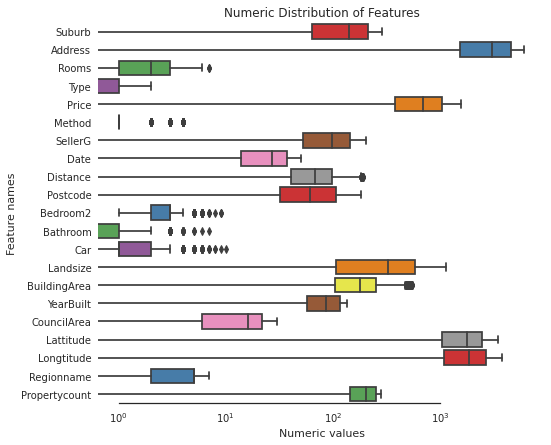

In [ ]:
#Checking the range of predictor/independent variable
sns.set_style("white")
f, ax = plt.subplots(figsize=(8, 7))
ax.set_xscale("log")
ax = sns.boxplot(data=data, orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

From the boxpot of independent variable we can determine the range of value of each variable. From this it can be observed that the values of all variables are scattered. From this plot it is observed that 'Method','Bathroom' ,'Car' and 'Rooms' have outliers.

First to normalize the data total number of numerical features whose skewnesss is greater than 0.5 should be calculated.



In [ ]:
# Find skewed numerical features
skew_features = data.apply(lambda x: skew(x)).sort_values(ascending=False)

high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

print("There are {} numerical features with Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})

There are 5 numerical features with Skew > 0.5 :


By using scipy function boxcox1p Box-Cox transformation is computred.This was done as the goal was to find a simple transformation that lets us normalize data. After normalizing when boxplot was plotted again, all the values of variables were not scattered.

In [ ]:
# Normalize skewed features
for i in skew_index:
    data[i] = boxcox1p(data[i], boxcox_normmax(data[i] + 1))

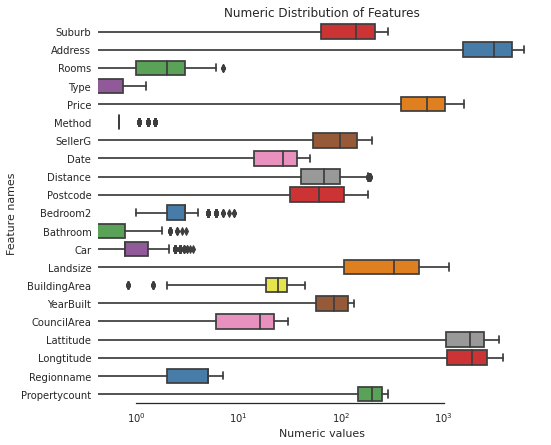

In [ ]:
#Checking the range of predictor/independent variable
sns.set_style("white")
f, ax = plt.subplots(figsize=(8, 7))
ax.set_xscale("log")
ax = sns.boxplot(data=data, orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

#Executing Linear Regression with Outliers

In [ ]:
def linear_reg(X_train,y_train,X_test,y_test):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(X_train,y_train)
    print('Train set')
    pred=linear_reg_model.predict(X_train)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_train,pred)))
    print('Test set')
    pred=linear_reg_model.predict(X_test)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_test,pred))) 
    
    plt.scatter(y_test,pred,color='gray')
    plt.xlabel('Actual values')
    plt.ylabel('Predicted values')
    plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test, pred, 1))(np.unique(y_test)))
    plt.text(0.6, 0.5, 'R-squared = %0.2f' % r2_score(y_test,pred))
    plt.show()
    df = pd.DataFrame({'Actual': y_test, 'Predicted': pred})
    df1 = df.head(30)
    df1.plot(kind='bar',figsize=(10,8))
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.show()
    visualizer = ResidualsPlot(linear_reg_model)
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.poof() 

Train set
Linear Regression Mean Squared error :33655.94459516529
Linear Regression r2_score :0.7914576933378715
Test set
Linear Regression Mean Squared error :33459.623879472645
Linear Regression r2_score :0.7957856832899698


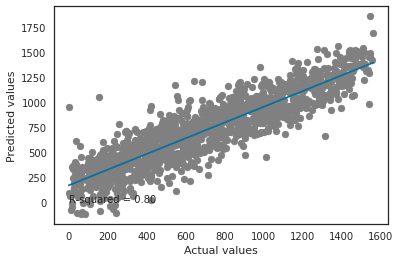

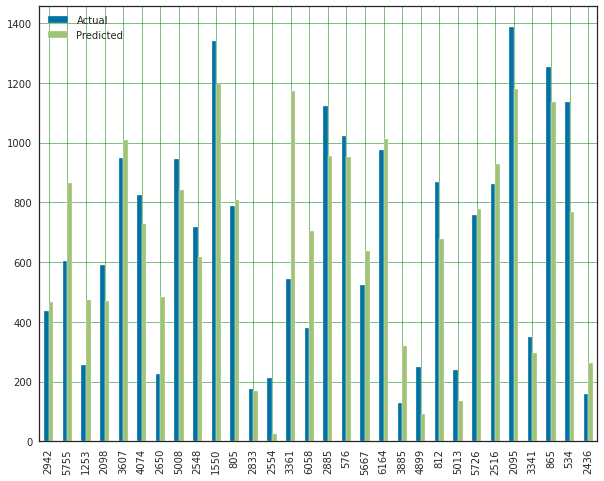

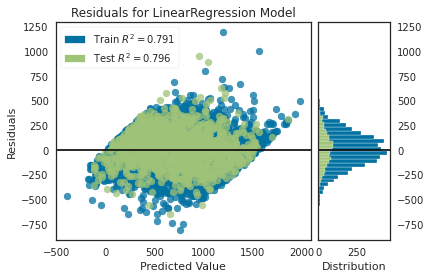

In [ ]:
linear_reg(X_train[cols],y_train,X_test[cols],y_test)

#Removing Outliers

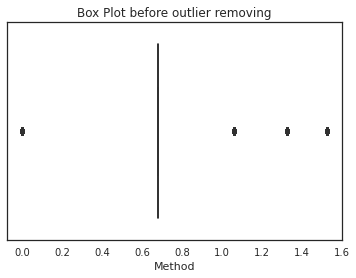

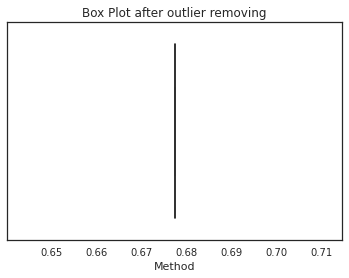

In [ ]:
sns.boxplot(data['Method'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(data, 'Method')
sns.boxplot(data['Method'])
plt.title("Box Plot after outlier removing")
plt.show()

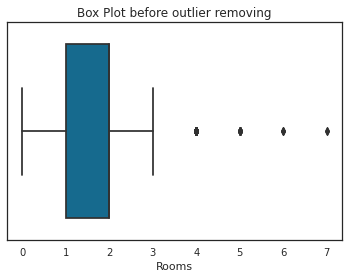

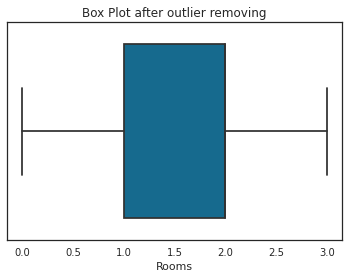

In [ ]:
sns.boxplot(data['Rooms'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(data, 'Rooms')
sns.boxplot(data['Rooms'])
plt.title("Box Plot after outlier removing")
plt.show()

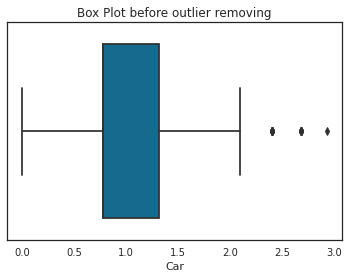

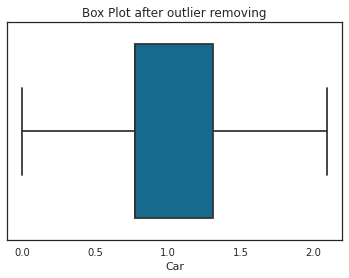

In [ ]:
sns.boxplot(data['Car'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(data, 'Car')
sns.boxplot(data['Car'])
plt.title("Box Plot after outlier removing")
plt.show()

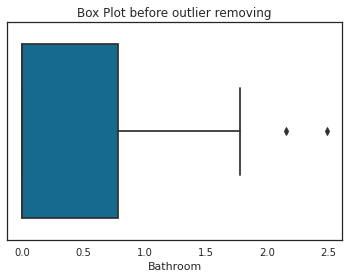

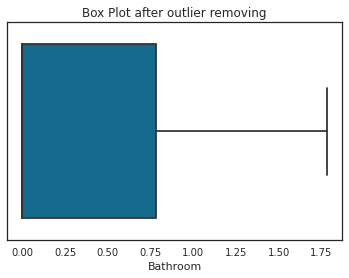

In [ ]:
sns.boxplot(data['Bathroom'])
plt.title("Box Plot before outlier removing")
plt.show()
def drop_outliers(df, field_name):
    iqr = 1.5 * (np.percentile(df[field_name], 75) - np.percentile(df[field_name], 25))
    df.drop(df[df[field_name] > (iqr + np.percentile(df[field_name], 75))].index, inplace=True)
    df.drop(df[df[field_name] < (np.percentile(df[field_name], 25) - iqr)].index, inplace=True)
drop_outliers(data, 'Bathroom')
sns.boxplot(data['Bathroom'])
plt.title("Box Plot after outlier removing")
plt.show()

# Splitting the data into testing and training

In [ ]:
#Splitting data in training and testing datasets

import numpy as np
data = pd.read_csv("https://github.com/Sanikap05/DataScience/raw/main/sample.csv")
import tensorflow_data_validation as tfdv
train=data.sample(frac=0.8,random_state=200) #80% of data in train set
test=data.drop(train.index) #remaining data in test set

#visualize train
train = tfdv.generate_statistics_from_dataframe(train[['Suburb', 'Rooms', 'Price', 'Method', 'Distance', 'Bedroom2', 'Bathroom', 'BuildingArea', 'YearBuilt', 'Propertycount']])
#visualize test
test = tfdv.generate_statistics_from_dataframe(test[['Suburb', 'Rooms', 'Price', 'Method', 'Distance', 'Bedroom2', 'Bathroom', 'BuildingArea', 'YearBuilt', 'Propertycount']])

#plot train and test together
tfdv.visualize_statistics(lhs_statistics=test, rhs_statistics=train,
                          lhs_name='TESTING_DATA', rhs_name='TRAINING_DATA')

#Executing Linear Regression after removing Outliers

In [ ]:
X=data.drop(['Price'],axis=1)
y=data['Price']

In [ ]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.2,random_state=42)

In [ ]:
cols2= ['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Distance', 'Postcode','Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt',
'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname','Propertycount']

In [ ]:
def linear_reg(X_train,y_train,X_test,y_test):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(X_train,y_train)
    print('Train set')
    pred=linear_reg_model.predict(X_train)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_train,pred)))
    print('Test set')
    pred=linear_reg_model.predict(X_test)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_test,pred))) 
   
    plt.scatter(y_test,pred,color='gray')
    plt.xlabel('Actual values')
    plt.ylabel('Predicted values')
    plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test, pred, 1))(np.unique(y_test)))
    plt.text(0.6, 0.5, 'R-squared = %0.2f' % r2_score(y_test,pred))
    plt.show()
    df = pd.DataFrame({'Actual': y_test, 'Predicted': pred})
    df1 = df.head(30)
    df1.plot(kind='bar',figsize=(10,8))
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.show()
    visualizer = ResidualsPlot(linear_reg_model)
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.poof() 

In [ ]:
from sklearn import linear_model

model = linear_model.LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

Train set
Linear Regression Mean Squared error :30317.458658262094
Linear Regression r2_score :0.7852742058715726
Test set
Linear Regression Mean Squared error :30673.171020889687
Linear Regression r2_score :0.7916100486744291


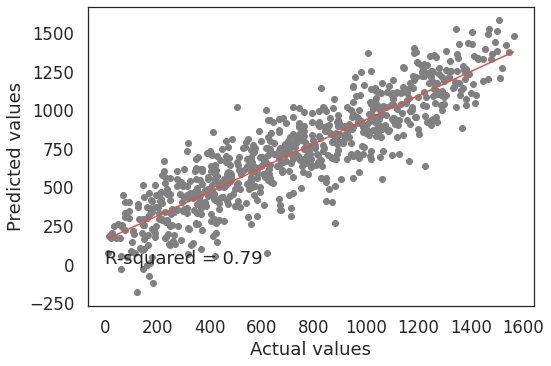

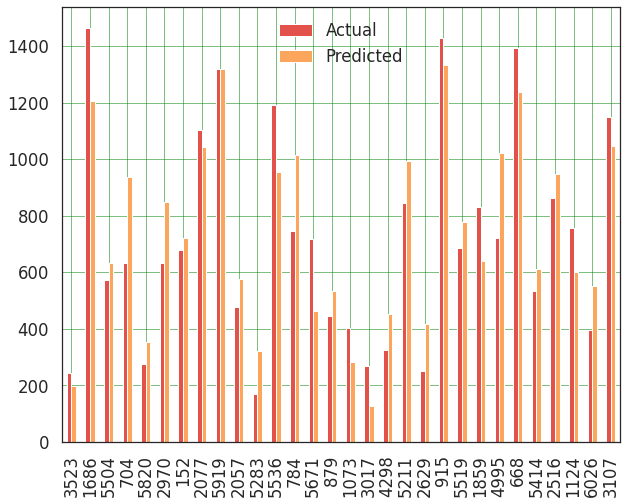

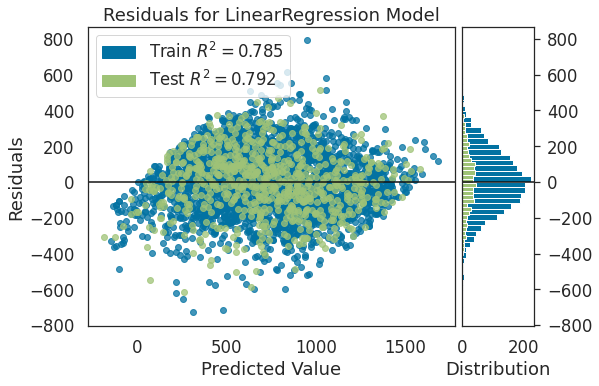

In [ ]:
linear_reg(X_train[cols2],y_train,X_test[cols2],y_test)

From the boxplot it can be observed that 'Method’, ‘Bathroom’, ‘Car' and 'Rooms' have outliers. When linear regression was calculated with outliers the accuracy of model on testing data was 79.1%.
Treating outliers is important as they affect the accuracy of the model. There are many ways to treat outliers like Quantile method, mean median imputation and Removing outliers.
For this dataset by selecting a particular range all other values were removed as there were outliers for 'Method’, ‘Bathroom’, ‘Car' and 'Rooms' variables. After removing the outliers when linear regression was applied to the model it was observed that for testing dataset the accuracy was increased to 79.8%.
So for this dataset accuracy increases on removing the outliers.


# SHAP Analysis on Linear Regression model

SHAP values for each feature represent the change in the expected model prediction when conditioning on that feature. For each feature, SHAP value explains the contribution to explain the difference between the average model prediction and the actual prediction of the instance.The essence of Shapley value is to measure the contributions to the final outcome from each player separately among the coalition, while preserving the sum of contributions being equal to the final outcome.SHAP values in model explanation can measure the input features contribution to individual predictions.

In [ ]:
%%capture
!pip install shap
import shap 

In [ ]:
import shap
shap.initjs()

In [ ]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = X_train.sample(frac=0.01,random_state=200)
#LinearExplainer is used as linear regression model is used
explainer = shap.LinearExplainer(model, X, feature_perturbation="interventional") 
shap_values = explainer.shap_values(X) #Saving SHAP values

In [ ]:
#Initialize java script
shap.initjs()

 #Explain one row in the data with the
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)  

In [ ]:
#Initializing explainer from shap, lm is our trained model
explainer_shap=shap.LinearExplainer(model=model, masker=X_train)

#Computing shap values for train dataset
shap_values = explainer_shap.shap_values(X_train)

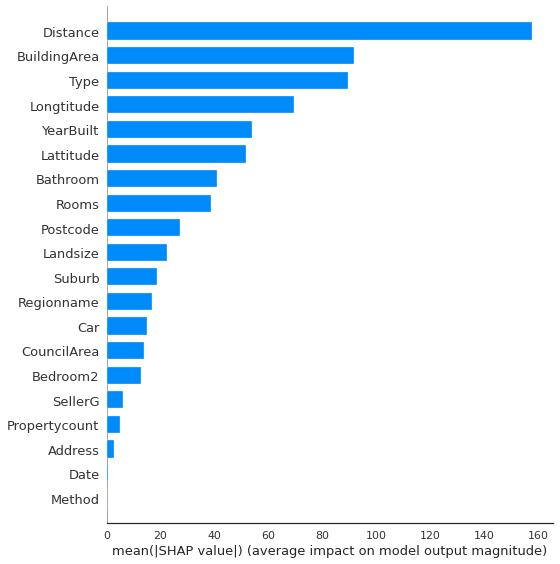

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

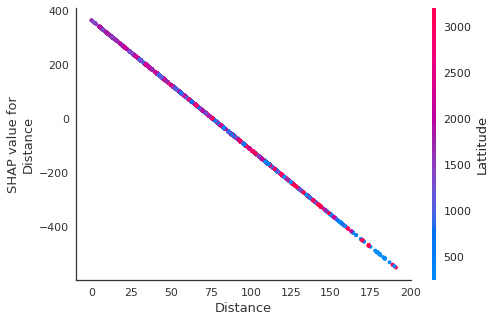

In [ ]:
shap.dependence_plot("Distance", shap_values, X_train)

In [ ]:
from sklearn.linear_model import LinearRegression
import shap

# train Linear model
#Seperating the dependent and independent variable from the main dataset
X=data.drop(['Price'],axis=1)
y=data['Price']
regressor = LinearRegression()
linear_reg = regressor.fit(X, y)

# compute SHAP values
explainer = shap.Explainer(linear_reg, X)
shap_values = explainer(X)

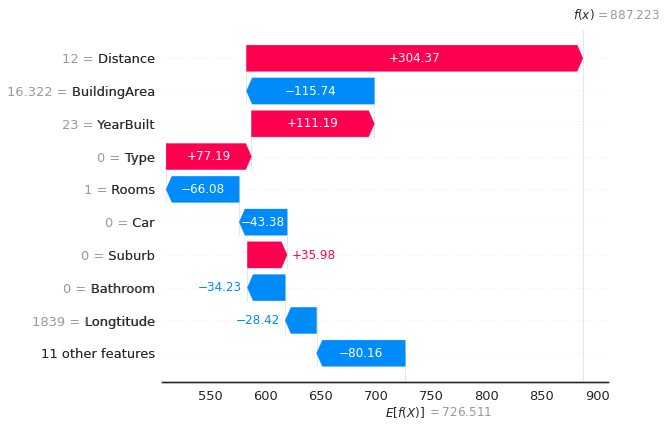

In [ ]:
shap.plots.waterfall(shap_values[0])

For the linear regression model from the plots it can be interpreted that distance, building area and Type are the important features for this regressor model. These are the makjor features in determining the Price of the house.

# Performing Random Forest

In [ ]:
def ramdomforest(X_train,y_train,X_test,y_test):
    rf = RandomForestRegressor()
    rf_model = rf.fit(X_train,y_train)
    print('Train set')
    pred=rf_model.predict(X_train)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_train,pred)))
    print('Tesst set')
    pred=rf_model.predict(X_test)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_test,pred)))

random_forest = RandomForestRegressor(n_estimators=100)
random_forest.fit(X_train, y_train) 

RandomForestRegressor()

In [ ]:
ramdomforest(X_train[cols],y_train,X_test[cols],y_test)

Train set
ramdomforest Mean Squared error :2626.507555892144
ramdomforest r2_score :0.9813975529057228
Tesst set
ramdomforest Mean Squared error :17644.77052316911
ramdomforest r2_score :0.8801234842015553


# SHAP Analysis on Random Forest Model


In [ ]:
%%capture
!pip install shap
import shap 

In [ ]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = X_train.head(10)
 # Using Tree explainer as this is tree based classifier model
explainer = shap.TreeExplainer(random_forest)
#Saving shap values
shap_values = explainer.shap_values(X) 

In [ ]:
shap.initjs() #Initialize java script
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:]) #Explain one row in the data with the model

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)  

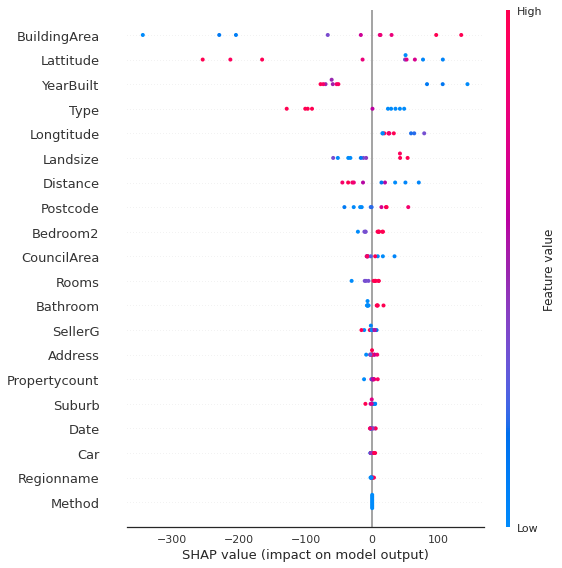

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, X) 

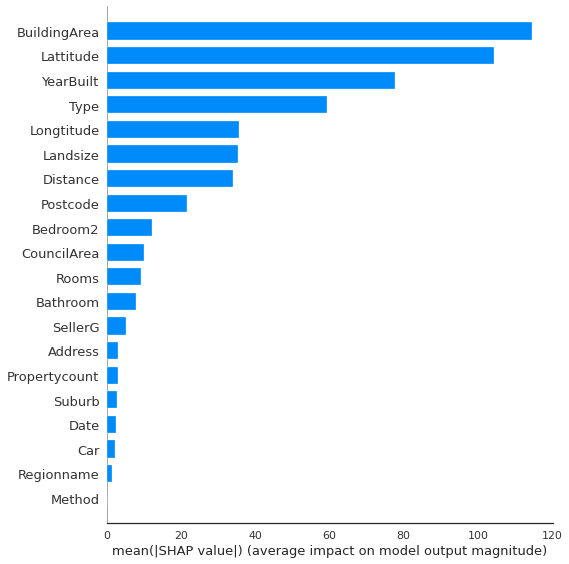

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import load_iris
iris = load_iris()

model_rf1 = RandomForestRegressor(n_estimators=10)
# Train
model_rf1.fit(iris.data, iris.target)
# Extract single tree
estimator = model_rf1.estimators_[5]

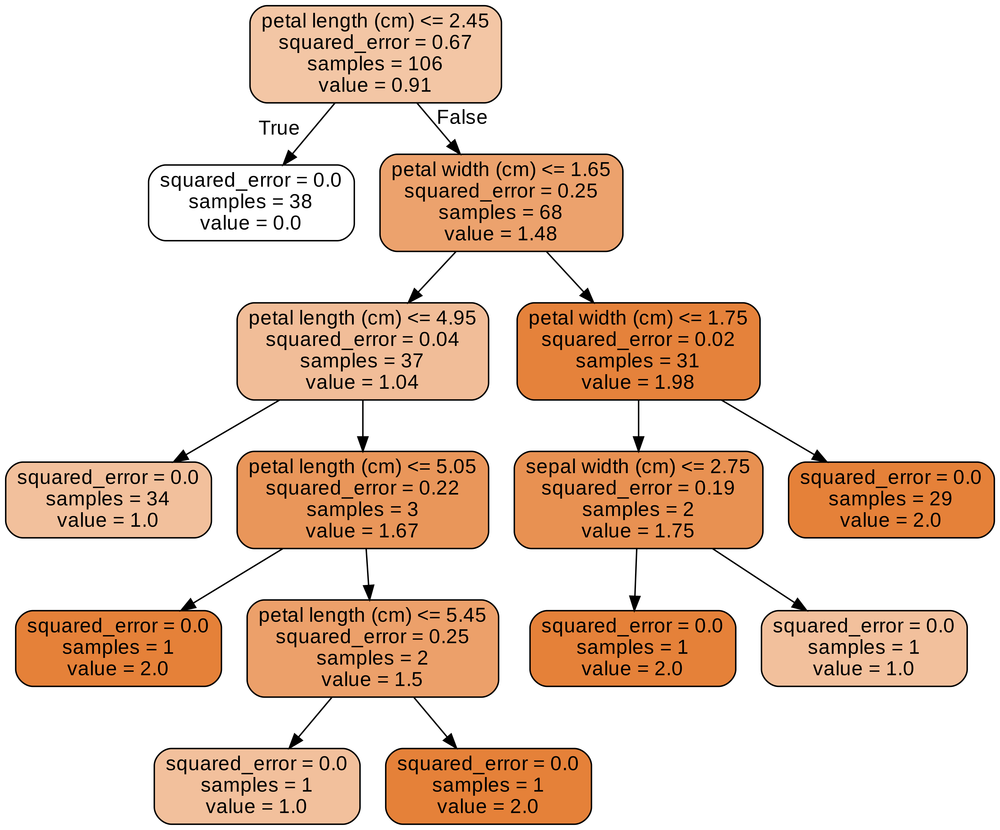

In [ ]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = iris.feature_names,
                class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in colab notebook
from IPython.display import Image
Image(filename = 'tree.png')

For the random forest model according to SHAP Analysis the important features to determine the target variable 'Price' are BuildingArea, Latitude and YearBuilt. BuildingArea is the common feature which is important for both Random Forest and Linear Regression Model. BuildingArea has the highest value of feature importance and is placed first on the scale.

# Using H20 AutoML to identify best model

In [ ]:
# Set a minimum memory size and a run time in seconds
min_mem_size=6 
run_time=222

In [ ]:
# Use 50% of availible resources
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

5


In [ ]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:41649 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.15" 2022-04-19; OpenJDK Runtime Environment (build 11.0.15+10-Ubuntu-0ubuntu0.18.04.1); OpenJDK 64-Bit Server VM (build 11.0.15+10-Ubuntu-0ubuntu0.18.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp8ru57m6y
  JVM stdout: /tmp/tmp8ru57m6y/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp8ru57m6y/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:41649
Connecting to H2O server at http://127.0.0.1:41649 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.1.1
H2O_cluster_version_age:,23 days
H2O_cluster_name:,H2O_from_python_unknownUser_riicyr
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
# Create a 80/20 train/test split
url = "https://github.com/Sanikap05/DataScience/raw/main/sample.csv"
df = h2o.import_file(path = url)
pct_rows=0.80
df_train, df_test = df.split_frame([pct_rows])

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Set the features and target
X=df.columns
print(X)

y ='Price'
X.remove(y) 
print(X)

['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG', 'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname', 'Propertycount']
['Suburb', 'Address', 'Rooms', 'Type', 'Method', 'SellerG', 'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname', 'Propertycount']


In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)
# Passing the training and testing dataset through H20 AutomML
aml.train(x=X,y=y,training_frame=df_train) 

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_3_AutoML_1_20220506_201732

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 4019.847043880364
RMSE: 63.40226371258651
MAE: 47.39569252422033
RMSLE: NaN
R^2: 0.9751085998042526
Mean Residual Deviance: 4019.847043880364
Null degrees of freedom: 4958
Residual degrees of freedom: 4947
Null deviance: 800855770.82194
Residual deviance: 19934421.490602724
AIC: 55253.76906842378

ModelMetricsRegressionGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 15013.493279265063
RMSE: 122.5295608384567
MAE: 90.49801300299028
RMSLE: NaN
R^2: 0.9070345549293308
Mean Residual Deviance: 15013.493279265063
Null degrees of freedom: 4958
Residual degrees of freedom: 4947
Null deviance: 801104411.9421548
Residual deviance: 74451913.1718754

,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,9.049485e+01,1.176307e+00,9.223338e+01,8.897669e+01,9.048817e+01,9.008422e+01,9.069181e+01
1,mean_residual_deviance,1.501007e+04,6.880718e+02,1.588491e+04,1.492426e+04,1.519758e+04,1.396995e+04,1.507367e+04
2,mse,1.501007e+04,6.880718e+02,1.588491e+04,1.492426e+04,1.519758e+04,1.396995e+04,1.507367e+04
3,null_deviance,1.602209e+08,2.929079e+06,1.601006e+08,1.602905e+08,1.631760e+08,1.620358e+08,1.555015e+08
4,r2,9.069751e-01,5.879841e-03,8.978806e-01,9.055888e-01,9.081994e-01,9.137618e-01,9.094448e-01
5,residual_deviance,1.489038e+07,9.700669e+05,1.634557e+07,1.513320e+07,1.496961e+07,1.396995e+07,1.403358e+07
6,rmse,1.224896e+02,2.820866e+00,1.260354e+02,1.221649e+02,1.232785e+02,1.181945e+02,1.227749e+02
7,rmsle,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(aml.leaderboard)

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20220506_201732,122.53,15013.5,90.498,nan,15013.5
StackedEnsemble_AllModels_2_AutoML_1_20220506_201732,124.052,15388.9,91.384,nan,15388.9
StackedEnsemble_AllModels_1_AutoML_1_20220506_201732,124.401,15475.7,91.3951,nan,15475.7
StackedEnsemble_BestOfFamily_3_AutoML_1_20220506_201732,125.628,15782.5,92.8318,nan,15782.5
StackedEnsemble_BestOfFamily_2_AutoML_1_20220506_201732,126.017,15880.4,92.907,nan,15880.4
StackedEnsemble_BestOfFamily_1_AutoML_1_20220506_201732,127.428,16237.9,94.7729,nan,16237.9
GBM_2_AutoML_1_20220506_201732,127.476,16250.2,94.3897,nan,16250.2
GBM_3_AutoML_1_20220506_201732,128.268,16452.7,94.9998,nan,16452.7
GBM_5_AutoML_1_20220506_201732,128.448,16498.8,95.9981,nan,16498.8
GBM_grid_1_AutoML_1_20220506_201732_model_3,128.765,16580.5,96.2619,nan,16580.5


In [ ]:
model_index=0
glm_index=0
glm_model=''
aml_leaderboard_df=aml.leaderboard.as_data_frame()
models_dict={}
for m in aml_leaderboard_df['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break 
  model_index=model_index+1  

for m in aml_leaderboard_df['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break  
  glm_index=glm_index+1     
models_dict

{'GBM_2_AutoML_1_20220506_201732': 6,
 'GLM_1_AutoML_1_20220506_201732': 29,
 'StackedEnsemble_AllModels_1_AutoML_1_20220506_201732': 2,
 'StackedEnsemble_AllModels_2_AutoML_1_20220506_201732': 1,
 'StackedEnsemble_AllModels_3_AutoML_1_20220506_201732': 0,
 'StackedEnsemble_BestOfFamily_1_AutoML_1_20220506_201732': 5,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20220506_201732': 4,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20220506_201732': 3}

In [ ]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index,'model_id'])

6


In [ ]:
#Printing the best model
print("The best model is - " , best_model.algo)

The best model is -  gbm


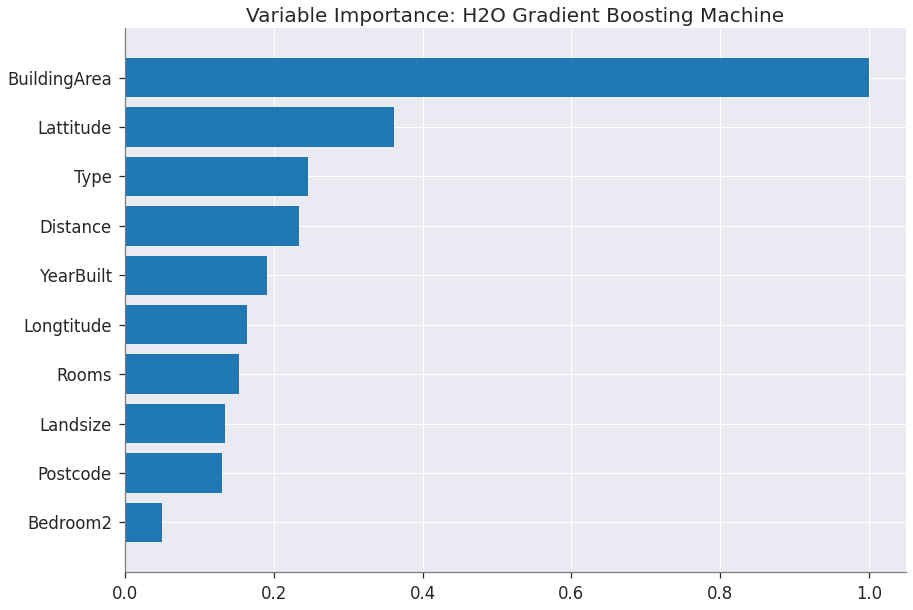

<Figure size 432x288 with 0 Axes>

In [ ]:
#plot variables in order of their importance for price prediction
if best_model.algo in ['gbm','drf','xrt','xgboost']:
    best_model.varimp_plot()

29
glm


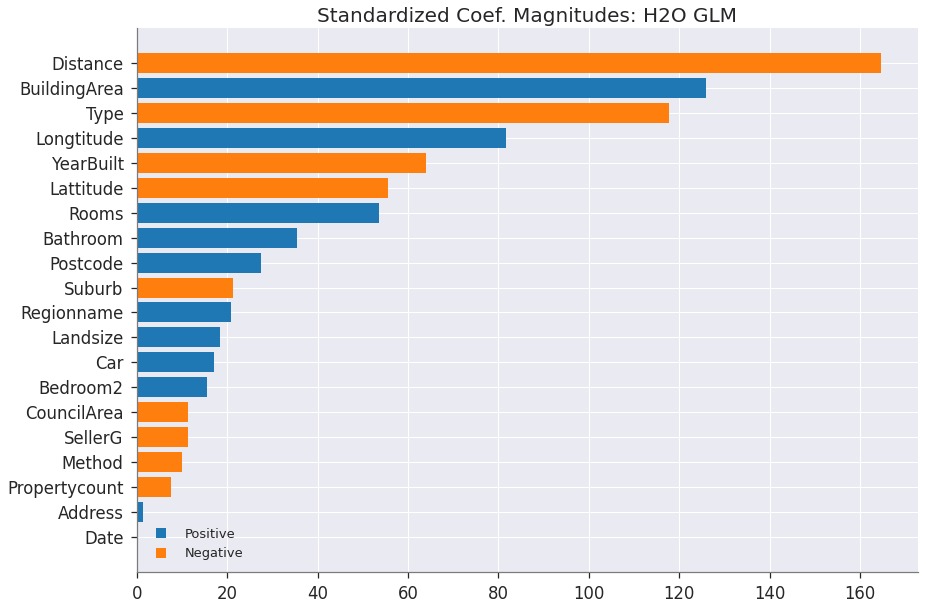

In [ ]:
if glm_index is not 0:
  print(glm_index)
  glm_model=h2o.get_model(aml.leaderboard[glm_index,'model_id'])
  print(glm_model.algo) 
  glm_model.std_coef_plot()

# Ridge Regularization in H20


The main purpose of regression is to find patterns in this underlying dataset and generalize it to predict the corresponding target value for some new values of independent values. But sometimes target dataset is inflicted with some random noise. Although there may not be error for training set it will give huge errors in predicting the correct target values for test dataset.To avoid this condition regularization is used. Regularization is a technique used for tuning the random noise function by adding an additional term to noise function. This additional term controls the excessively fluctuating function such that the coefficients don’t take extreme values and the prediction of target value for test data is not highly affected.
For this model, Ridge Regularization is used.

In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
house_glm = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = 0, compute_p_values = True)
house_glm_regularization = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = .001, alpha = 0)

In [ ]:
house_glm_regularization.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_model_python_1644813941727_1


GLM Model: summary


,,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,gaussian,identity,Ridge ( lambda = 0.001 ),15,15,1,py_102_sid_bed2




ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 38033.170286105706
RMSE: 195.02094832634188
MAE: 155.1869122363275
RMSLE: NaN
R^2: 0.7658482616169668
Mean Residual Deviance: 38033.170286105706
Null degrees of freedom: 4922
Residual degrees of freedom: 4907
Null deviance: 799640859.4336785
Residual deviance: 187237297.31849837
AIC: 65923.88012408071

Scoring History: 


,,timestamp,duration,iterations,negative_log_likelihood,objective,training_rmse,training_deviance,training_mae,training_r2
0,,2022-02-14 04:56:41,0.000 sec,0,799640859.433679,162429.587535,,,,
1,,2022-02-14 04:56:41,0.020 sec,1,,,195.020948,38033.170286,155.186912,0.765848



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Distance,194.540817,1.000000,0.221543
1,Type,150.606979,0.774166,0.171511
2,BuildingArea,123.716675,0.635942,0.140888
3,Lattitude,86.918152,0.446786,0.098982
4,Rooms,77.233734,0.397005,0.087954
5,Postcode,69.591003,0.357719,0.079250
6,CouncilArea,29.796965,0.153166,0.033933
7,Suburb,27.546249,0.141596,0.031370
8,Landsize,27.387695,0.140781,0.031189
9,Regionname,25.351866,0.130316,0.028871


In [ ]:
#Model details without regularization
house_glm.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_model_python_1644813941727_2


GLM Model: summary


,,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,gaussian,identity,None,15,15,1,py_102_sid_bed2




ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 38033.04555034135
RMSE: 195.02062852514177
MAE: 155.17463113724503
RMSLE: NaN
R^2: 0.7658490295544237
Mean Residual Deviance: 38033.04555034135
Null degrees of freedom: 4922
Residual degrees of freedom: 4907
Null deviance: 799640859.4336785
Residual deviance: 187236683.24433047
AIC: 65923.86397830138

Scoring History: 


,,timestamp,duration,iterations,negative_log_likelihood,objective,training_rmse,training_deviance,training_mae,training_r2
0,,2022-02-14 04:56:41,0.000 sec,0,799640859.433679,162429.587535,,,,
1,,2022-02-14 04:56:41,0.114 sec,1,,,195.020629,38033.04555,155.174631,0.765849



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Distance,194.864380,1.000000,0.221673
1,Type,150.781570,0.773777,0.171526
2,BuildingArea,123.863136,0.635638,0.140904
3,Lattitude,86.990311,0.446415,0.098958
4,Rooms,77.248131,0.396420,0.087876
5,Postcode,69.704765,0.357709,0.079295
6,CouncilArea,29.866497,0.153268,0.033975
7,Suburb,27.554432,0.141403,0.031345
8,Landsize,27.386436,0.140541,0.031154
9,Regionname,25.425135,0.130476,0.028923


The accuracy and other related variables were same for both the cases:
When dataset was regularized and when dataset was not regularized. This tells that for this specific model regularization does not help.

# Hyperparameter Tuning

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset.

In [ ]:
s = dfpd1['Price']

t = dfpd1.drop(['Price'], axis = 1)

In [ ]:
t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction



random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)


In [ ]:
random_rf.best_params_

# SHAP Analysis on AutoML model


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_3_AutoML_1_20220506_201732,122.53,15013.5,90.498,nan,15013.5,1146,0.321679,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20220506_201732,124.052,15388.9,91.384,nan,15388.9,808,0.317277,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20220506_201732,124.401,15475.7,91.3951,nan,15475.7,965,0.240318,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_1_20220506_201732,125.628,15782.5,92.8318,nan,15782.5,547,0.114573,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20220506_201732,126.017,15880.4,92.907,nan,15880.4,505,0.05693,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20220506_201732,127.428,16237.9,94.7729,nan,16237.9,598,0.054389,StackedEnsemble
GBM_2_AutoML_1_20220506_201732,127.476,16250.2,94.3897,nan,16250.2,1154,0.037893,GBM
GBM_3_AutoML_1_20220506_201732,128.268,16452.7,94.9998,nan,16452.7,1597,0.034845,GBM
GBM_5_AutoML_1_20220506_201732,128.448,16498.8,95.9981,nan,16498.8,1091,0.035484,GBM
GBM_grid_1_AutoML_1_20220506_201732_model_3,128.765,16580.5,96.2619,nan,16580.5,895,0.064819,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

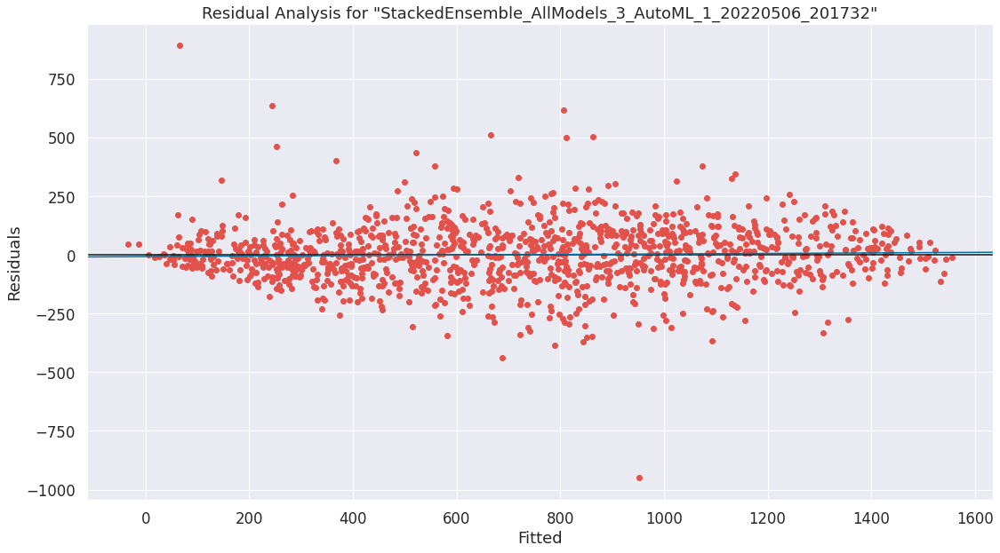

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

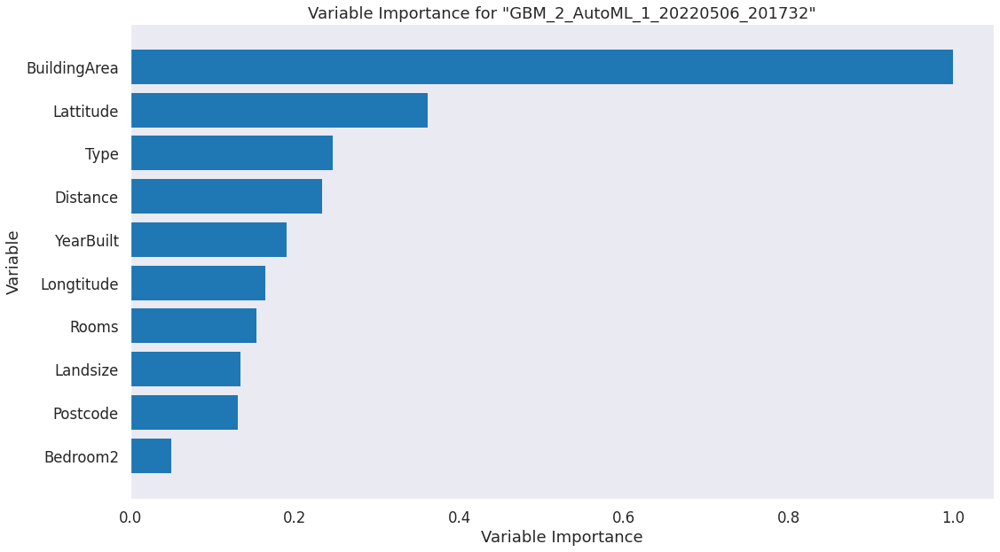

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

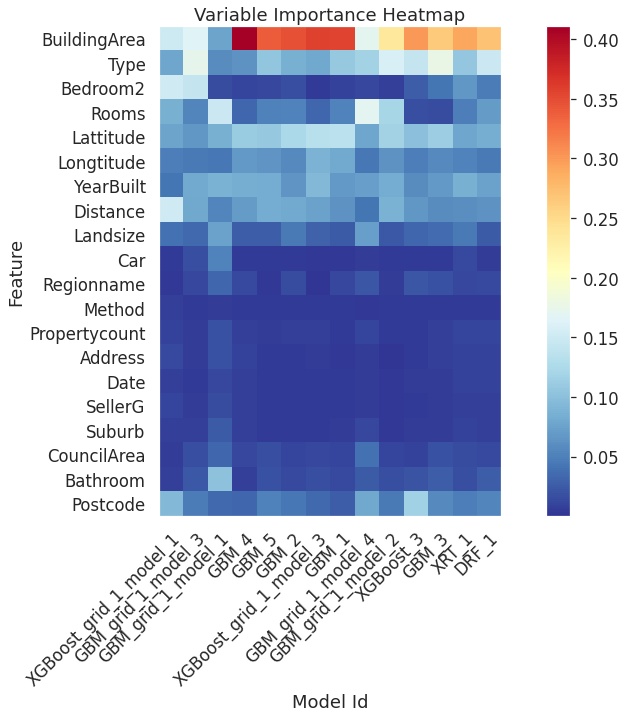

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

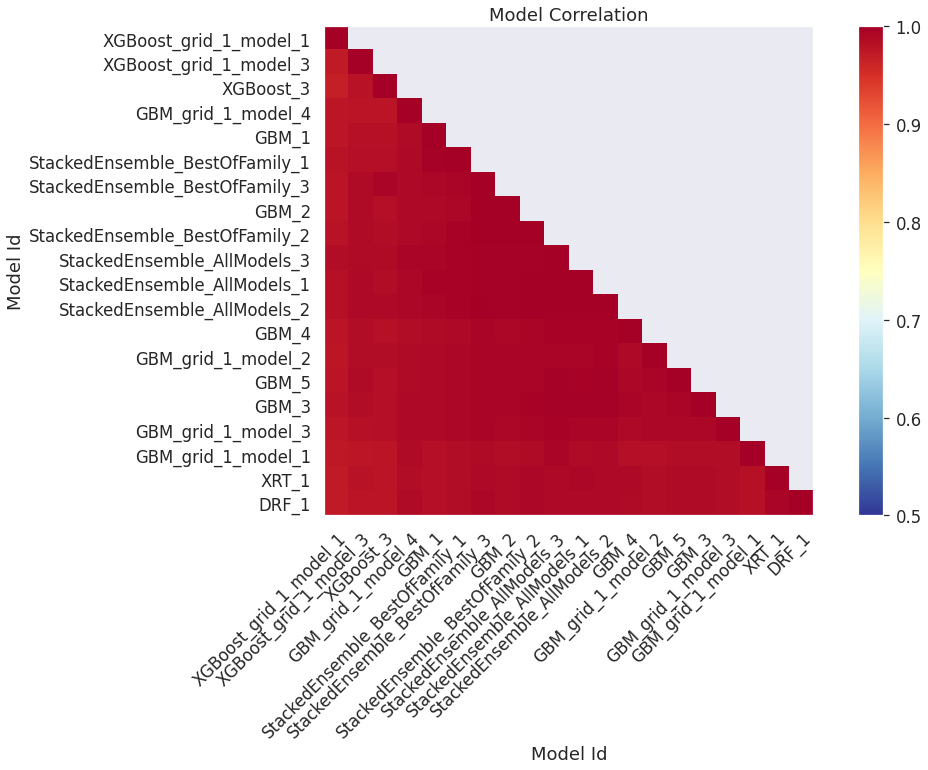

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

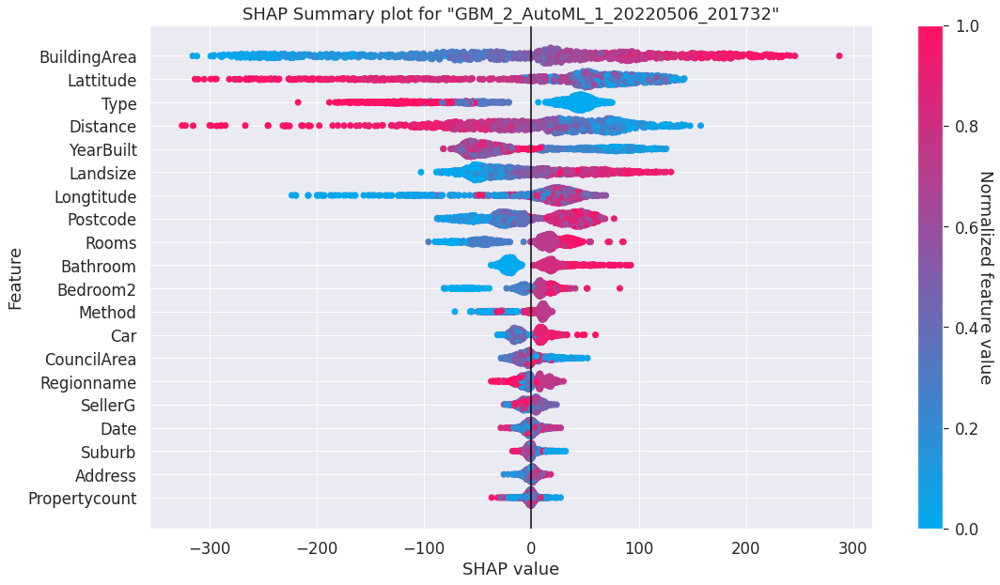

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

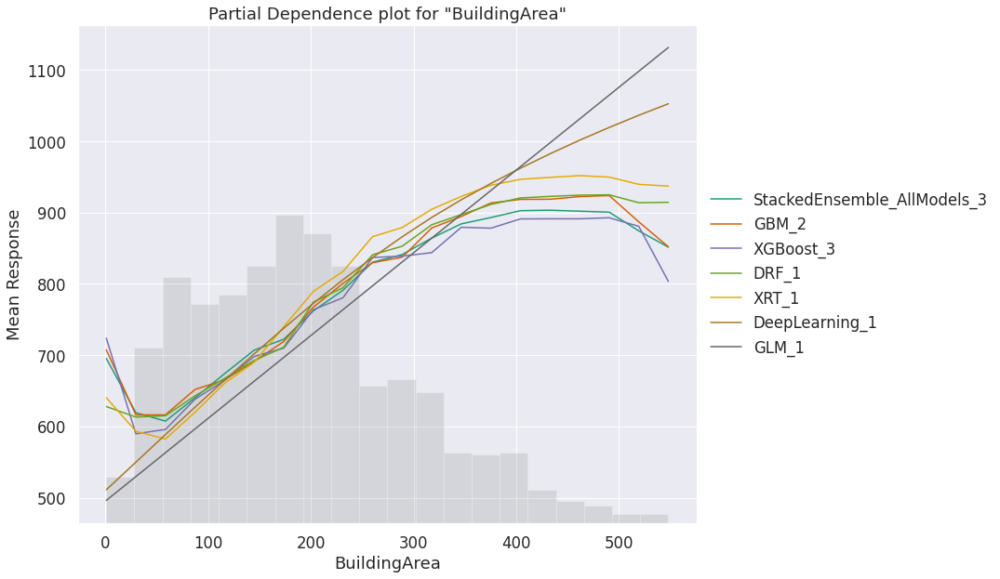

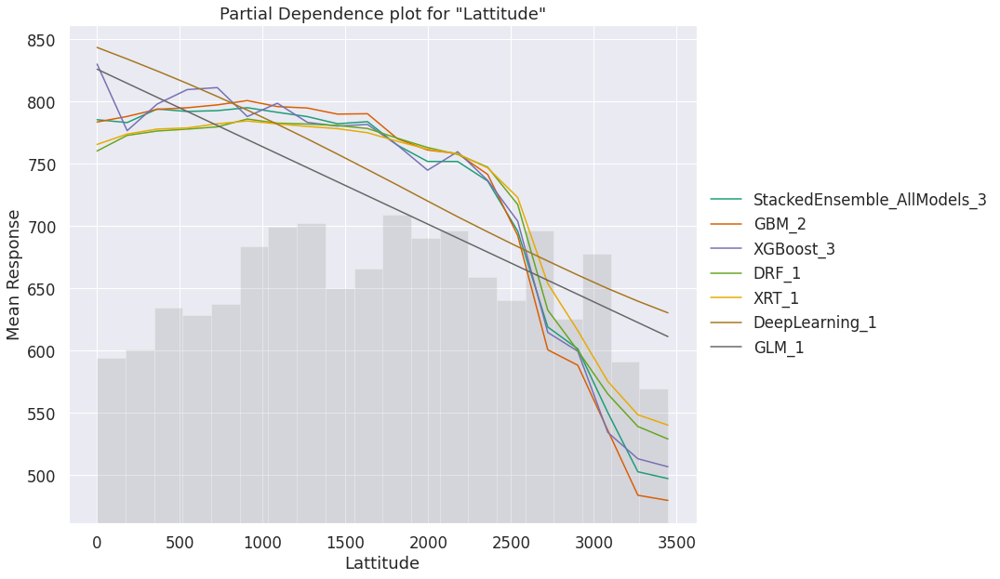

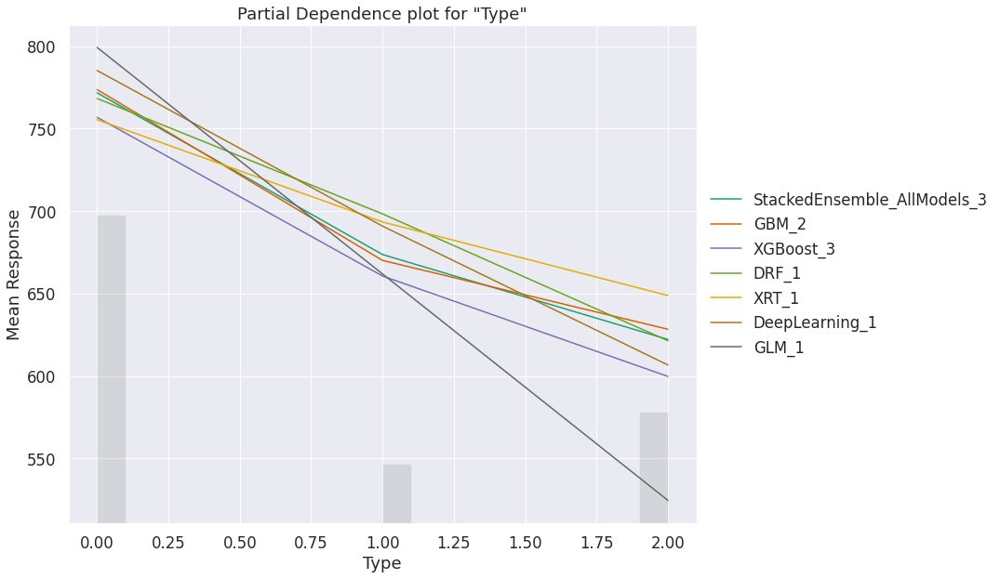

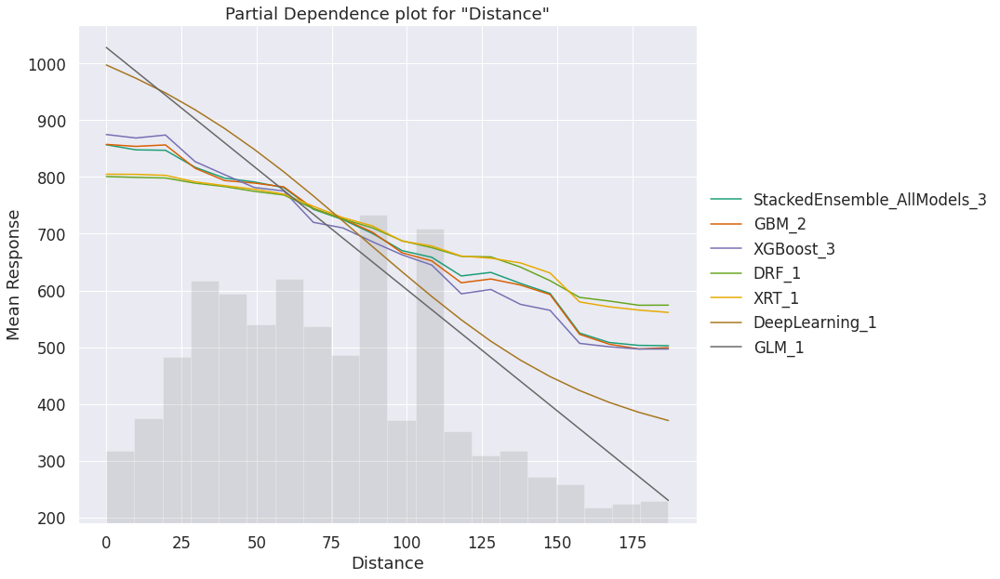

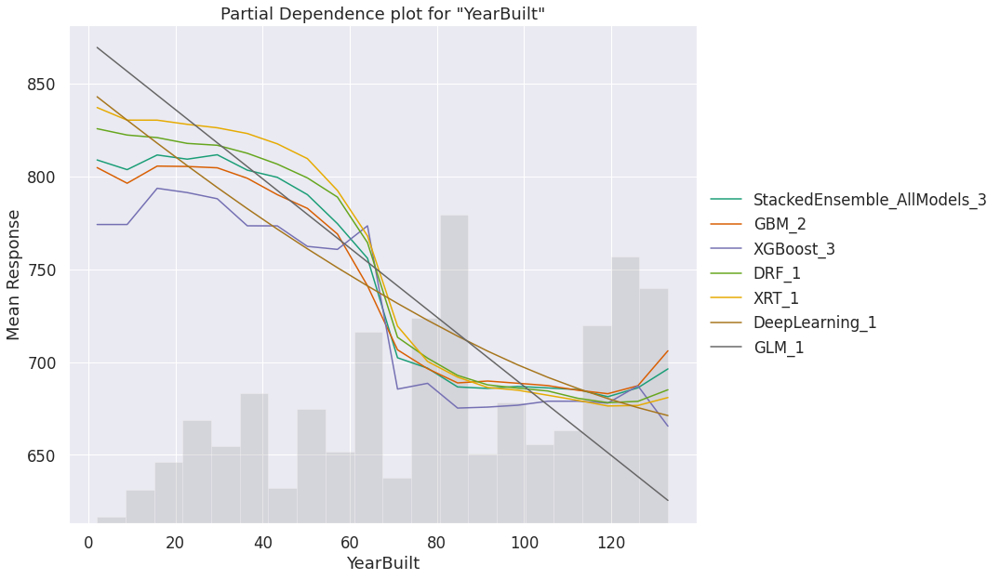

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

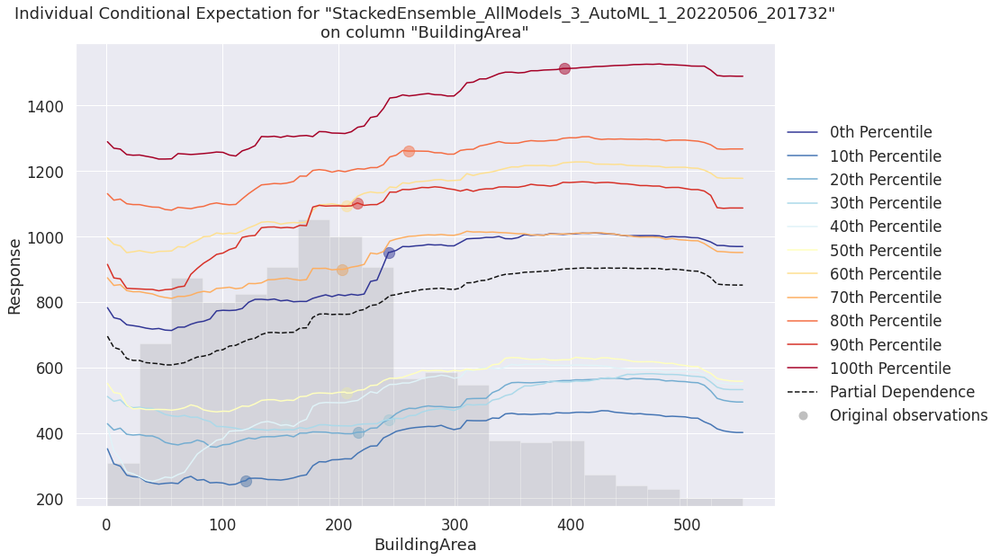

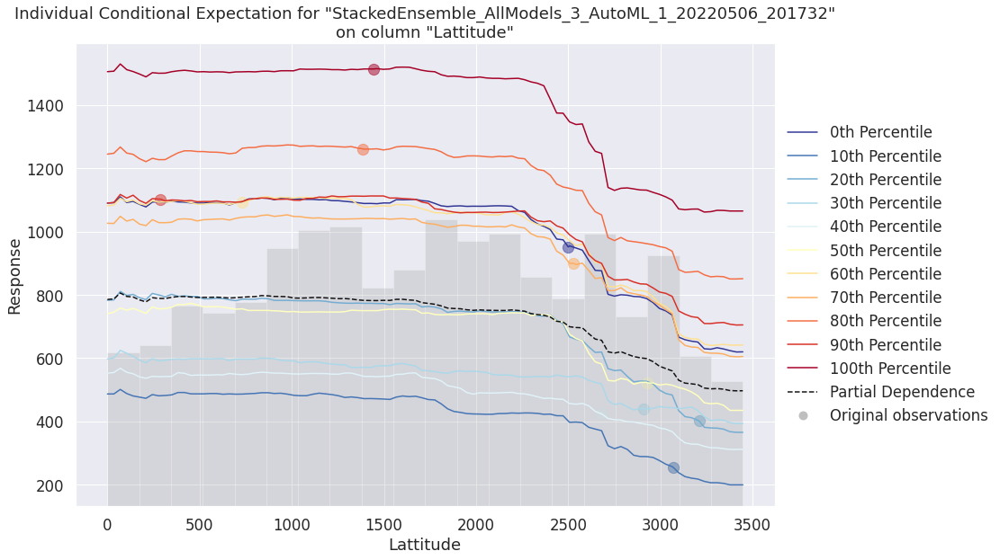

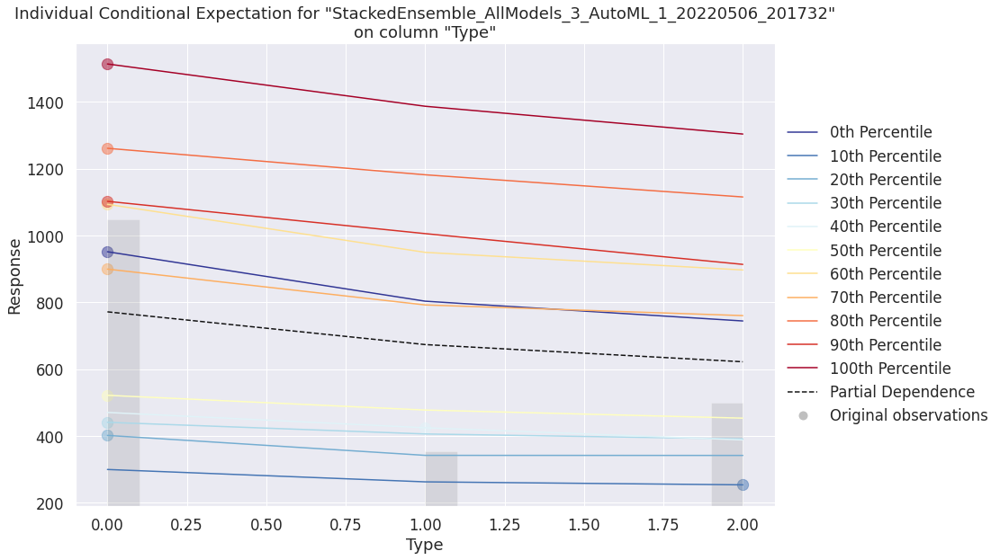

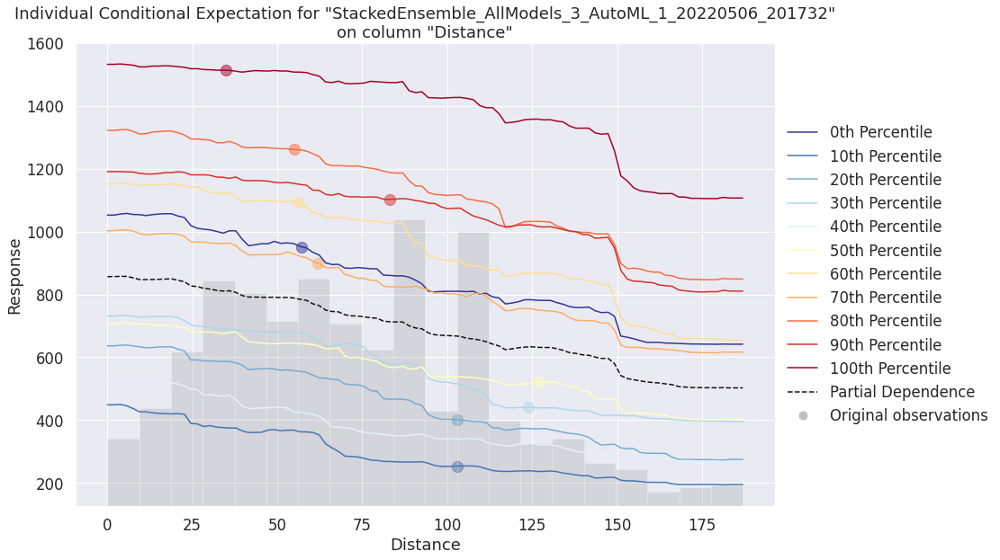

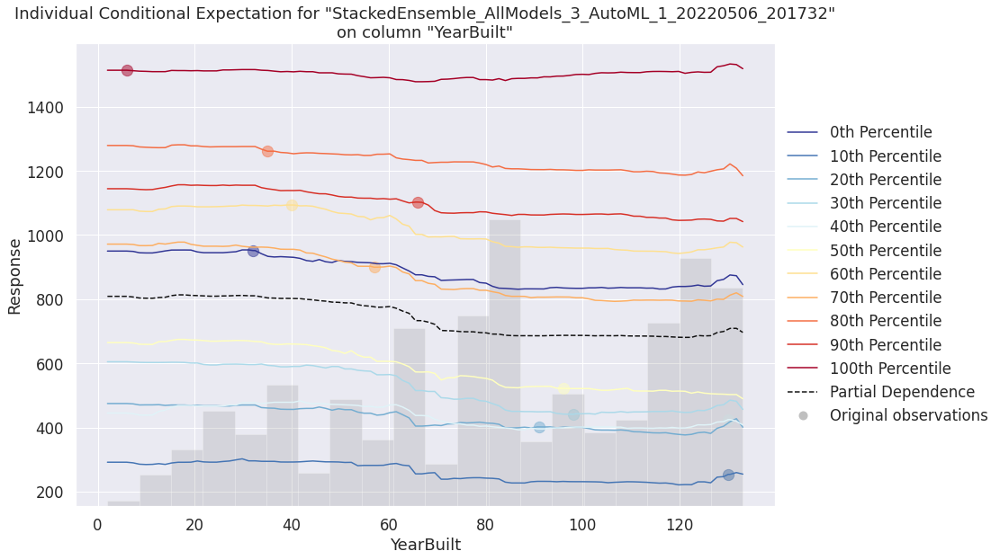

In [ ]:
exa = aml.explain(df_test)

# Conclusion

For the linear regression model to perform better feature extraction is performed. From various methods like computing correlation matrix, calculating p-value and VIF all the unnecessary variables are identified and then dropped from the dataset. Further, the accuracy of the model was checked by keeping the outliers and then removing those. It was observed that by removing the outliers the accuracy increases.For each model, the important feature obtained were different. Among all these 3 models the best accuracy was obtained for random forest model.The important features for this model were BuildingArea, Latitude and YearBuilt. This means that for this model the target variable 'Price' is highly depended on BuildingArea, Latitude and YearBuilt.


> 

For this dataset the best model according to AutoML is gbm. When a classifier like Random Forest was implemented on this dataset it gave a better accuracy. The accuracy on testing data was 88.09 percent. On the other hand when Linear Regression was implemented the accuracy for training data was 79.8 percent. After implementing these model I calculated SHAP values using SHAP analysis method. I plotted different plots like permutation plots, waterfall plot, feature importance bar chart and many more plots.






# Assignment Question/Answer

What is the question?

> The main aim of this notebook was to read the csv file and identify any dirty values like nulls or outliers. Then data cleaning should be performed and on that different algorithms like random forest, linear regression and H20 AutoML should be implemented.Depending on the accuracy the best model should be identified.




What did you do?

> I read the csv file and checked for null values.Other than that I checked if all the variables are uniformly distributed and if any outliers are present. I removed all the outliers with boxplot. I even checked if there is multi collinearity among variables by computing correlation matrix and calculating VIF value.Based on that I removed the redundant variables to improve the model.After that I executed 2 models, Random Forest and Linear Rgression. I even executed H20 AutoML model to identify which is the best model for this data.



How well did it work?

> For all the models, I achieved accuracy greater than 75% and testing data had more accuracy then training data. I performed regularization and even removed outliers. For H20 AutoML I even did hyperparameter tuning which further improved the result. The target variable Price was a bit skewed so I performed the required code and corrected the skewness.For Random Forest I got accuracy of 82.3% for testing data while for Linear Regression I got accuracy of 75.8%. Given that the dataset is about housing, Price can never be predicted exactly as it depends on number of values.



What did you learn?


>While writing this notebook I have learned concepts like p-value,regularization,VIF and many such topics. Depening on p-value and VIF I understood the logic and need of feature extraction.With help of those values I dropped the unnecessary variables and it helped the model to be more accurate.
Also for this model the best results will be obtained if gbm is used. Between linear regression and random forest, the latter resulted in better accuracy.



#License

**MIT** License

Copyright (c) 2022 Sanika Patne

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

# Reference

>OLS Model- http://net-informations.com/ds/mla/ols.html
> Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/
>Kaggle Notebook- https://www.kaggle.com/stephaniestallworth/melbourne-housing-market-eda-and-regression
>Dataset- https://www.kaggle.com/dansbecker/melbourne-housing-snapshot
>https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques
>Notebook to help on creating missing data and performing Imputation-https://colab.research.google.com/drive/18Ucw2g9U1kwQIhalRL-MXbKTdqRdRn24?usp=sharing
>https://colab.research.google.com/drive/1wEfzH165Ycm_EqVgwSz_r7SvILuj0KRW?usp=sharing (Links to an external site.)
